In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from tqdm.auto import tqdm
import random
from sklearn.model_selection import train_test_split
from pathlib import Path
from PIL import Image

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Model

In [2]:
config = {
    'patch_size': 16,
    'img_size': 224,
    'dim': 256,
    'num_channels': 3,
    'num_heads': 4,
    'attn_drop': 0.1,
    'mlp_drop': 0.1,
    'pos_drop': 0.1,
    'encoder_depth': 6,
    'decoder_depth': 4,
    'decoder_dim': 128,
    'norm_pix_loss': False, # True: pretraining for downstream. # False: for reconstruction
    'mask_ratio': 0.5
}

In [3]:
def get_1d_embed_from_grid(dim,pos):
    '''
    dim: embedding dim
    pos: list of positions to be encoded (M,)
    
    output: (M,D)
    '''
    assert dim%2==0
    
    omega = np.arange(dim//2,dtype=np.float32)
    omega /= dim/2.
    omega = 1./10000 ** omega # (D/2,)
    
    pos = pos.reshape(-1)
    out = np.einsum('m,d->md',pos, omega) # outer product (M,D/2)
    
    sin = np.sin(out)
    cos = np.cos(out)
    
    out = np.concatenate([sin,cos],axis=1) # (M/D)
    return out

def get_2d_sincos_pos_embed_from_grid(dim, grid):
    assert dim % 2 == 0

    # use half of dimensions to encode grid_h
    emb_h = get_1d_embed_from_grid(dim // 2, grid[0])  # (H*W, D/2)
    emb_w = get_1d_embed_from_grid(dim // 2, grid[1])  # (H*W, D/2)

    emb = np.concatenate([emb_h, emb_w], axis=1) # (H*W, D)
    return emb

def get_2d_sincos_pos_embed(dim, grid_size):
    """
    grid_size: int of the grid height and width
    return:
    pos_embed: [grid_size*grid_size, dim]
    """
    grid_h = np.arange(grid_size, dtype=np.float32)
    grid_w = np.arange(grid_size, dtype=np.float32)
    grid = np.meshgrid(grid_w, grid_h)  # here w goes first
    grid = np.stack(grid, axis=0)

    grid = grid.reshape([2, 1, grid_size, grid_size])
    pos_embed = get_2d_sincos_pos_embed_from_grid(dim, grid)
    return pos_embed

In [4]:
class PatchEmbedding(nn.Module):
    def __init__(self,**config):
        super().__init__()
        self.patch_size = config['patch_size']
        self.img_size = config['img_size']
        self.grid_size = self.img_size // self.patch_size
        self.num_patches = self.grid_size ** 2
        self.dim = config['dim']
        
        self.proj = nn.Conv2d(
            config['num_channels'],
            self.dim,
            kernel_size=self.patch_size,
            stride=self.patch_size
        )
        
    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2).permute(0,2,1) # b,dim,h,w -> b,h*w,dim
        return x
    
class ViTBlock(nn.Module):
    def __init__(self,is_decoder=False,**config):
        super().__init__()
        
        dim = config['decoder_dim'] if is_decoder else config['dim']
        assert dim % config['num_heads'] == 0, 'dim%num_heads!=0'
        
        self.dim = dim
        self.num_heads = config['num_heads']
        self.attn = nn.MultiheadAttention(
            embed_dim=self.dim,
            num_heads=self.num_heads,
            batch_first=True,
            dropout=config['attn_drop']
        )
        self.mlp = nn.Sequential(
            nn.Linear(self.dim,self.dim*4),
            nn.GELU(),
            nn.Dropout(config['mlp_drop']),
            nn.Linear(self.dim*4,self.dim)
        )
        self.ln1 = nn.LayerNorm(self.dim)
        self.ln2 = nn.LayerNorm(self.dim)
        
    def forward(self,x):
        x = self.ln1(x)
        x = x + self.attn(x,x,x)[0]
        x = x + self.mlp(self.ln2(x))
        return x
    
class ViTMAE(nn.Module):
    def __init__(self,**config):
        super().__init__()
        
        self.config = config
        
        self.norm_pix_loss = self.config['norm_pix_loss']
        
        self.patch_embed = PatchEmbedding(**config)
        num_patches = self.patch_embed.num_patches
        self.pos_embed = nn.Parameter(torch.zeros(1,num_patches,config['dim']),requires_grad=False)
        
        self.blocks = nn.ModuleList([
            ViTBlock(**config) for _ in range(config['encoder_depth'])
        ])
        
        self.encoder_norm = nn.LayerNorm(config['dim'])
        
        # MAE stuff
        
        self.decoder_embed = nn.Linear(config['dim'],config['decoder_dim'])
        
        self.mask_token = nn.Parameter(torch.zeros(1,1,config['decoder_dim']))
        
        self.decoder_pos_embed = nn.Parameter(torch.zeros(1,num_patches,config['decoder_dim']),requires_grad=False)
        
        self.decoder_blocks = nn.ModuleList([
            ViTBlock(is_decoder=True,**config) for _ in range(config['decoder_depth'])
        ])
        
        self.decoder_norm = nn.LayerNorm(config['decoder_dim'])
        
        out_features = config['patch_size'] ** 2 * config['num_channels']
        
        self.decoder_head = nn.Linear(config['decoder_dim'],out_features)
        
        self.initialize_weights()
        
    def initialize_weights(self):
        
        pos_embed = get_2d_sincos_pos_embed(
            self.pos_embed.shape[-1],
            int(self.patch_embed.num_patches**.5)
        )
        self.pos_embed.data.copy_(torch.from_numpy(pos_embed).float().unsqueeze(0))

        decoder_pos_embed = get_2d_sincos_pos_embed(
            self.decoder_pos_embed.shape[-1], 
            int(self.patch_embed.num_patches**.5)
        )
        self.decoder_pos_embed.data.copy_(torch.from_numpy(decoder_pos_embed).float().unsqueeze(0))
        torch.nn.init.normal_(self.mask_token, std=.02)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
            
    def random_masking(self, x):
        
        mask_ratio = self.config['mask_ratio']
        
        N, L, D = x.shape  # batch, length, dim
        len_keep = int(L * (1 - mask_ratio))
        
        noise = torch.rand(N, L, device=x.device)  # noise in [0, 1]
        
        # sort noise for each sample
        ids_shuffle = torch.argsort(noise, dim=1)  # ascend: small is keep, large is remove
        ids_restore = torch.argsort(ids_shuffle, dim=1)

        # keep the first subset
        ids_keep = ids_shuffle[:, :len_keep]
        x_masked = torch.gather(x, dim=1, index=ids_keep.unsqueeze(-1).repeat(1, 1, D))

        # generate the binary mask: 0 is keep, 1 is remove
        mask = torch.ones([N, L], device=x.device)
        mask[:, :len_keep] = 0
        # unshuffle to get the binary mask
        mask = torch.gather(mask, dim=1, index=ids_restore)

        return x_masked, mask, ids_restore
    
    def patchify(self,imgs):
        """
        imgs: (N, 3, H, W)
        x: (N, L, patch_size**2 *3)
        """
        c = self.config['num_channels']
        p = self.patch_embed.patch_size
        assert imgs.shape[2] == imgs.shape[3] and imgs.shape[2] % p == 0

        h = w = imgs.shape[2] // p
        x = imgs.reshape(shape=(imgs.shape[0], c, h, p, w, p))
        x = torch.einsum('nchpwq->nhwpqc', x)
        x = x.reshape(shape=(imgs.shape[0], h * w, p**2 * c))
        return x
    
    def unpatchify(self, x):
        """
        x: (N, L, patch_size**2 *3)
        imgs: (N, 3, H, W)
        """
        c = self.config['num_channels']
        p = self.patch_embed.patch_size
        h = w = int(x.shape[1]**.5)
        assert h * w == x.shape[1]
        
        x = x.reshape(shape=(x.shape[0], h, w, p, p, c))
        x = torch.einsum('nhwpqc->nchpwq', x)
        imgs = x.reshape(shape=(x.shape[0], c, h * p, h * p))
        return imgs
    
    def forward_encoder(self, x):
        
        x = self.patch_embed(x)
        x = x + self.pos_embed
        
        x, mask, ids_restore = self.random_masking(x)
        
        for block in self.blocks:
            x = block(x)
            
        x = self.encoder_norm(x)
        
        return x, mask, ids_restore
    
    def forward_decoder(self,x,ids_restore):
        
        x = self.decoder_embed(x)
        mask_tokens = self.mask_token.repeat(
            x.shape[0], ids_restore.shape[1] - x.shape[1], 1
        )
        x_ = torch.cat([x,mask_tokens],dim=1)
        
        #unshuffle
        x = torch.gather(x_,dim=1,index=ids_restore.unsqueeze(-1).repeat(1,1,x.shape[2]))
        
        x = x+self.decoder_pos_embed
        
        for block in self.decoder_blocks:
            x = block(x)
            
        x = self.decoder_norm(x)
        x = self.decoder_head(x)
        
        return x
    
    
    def forward_loss(self, imgs, pred, mask):
        """
        imgs: [N, 3, H, W]
        pred: [N, L, p*p*3]
        mask: [N, L], 0 is keep, 1 is remove, 
        """
        target = self.patchify(imgs)
        
        if self.norm_pix_loss:
            mean = target.mean(dim=-1, keepdim=True)
            var = target.var(dim=-1, keepdim=True)
            target = (target - mean) / (var + 1.e-6)**.5

#         loss = (pred - target) ** 2
#         loss = loss.mean(dim=-1)  # [N, L], mean loss per patch
#         loss = F.smooth_l1_loss(pred,target)
        loss = F.mse_loss(pred,target)

        loss = (loss * mask).sum() / mask.sum()  # mean loss on removed patches
        return loss
    
    def forward(self, imgs):
        latent, mask, ids_restore = self.forward_encoder(imgs)
        preds = self.forward_decoder(latent,ids_restore)
        
        loss = self.forward_loss(imgs,preds,mask)
        return loss, preds, mask

# Dataset

In [5]:
class Dataset:
    def __init__(self, images,tfms):
        self.images = images
        self.tfms = tfms
    def __len__(self):
        return len(self.images)
    def __getitem__(self,idx):
        im = self.images[idx]
        im = Image.open(im).convert('RGB')
        im = self.tfms(im)
        return im

In [6]:
train_tfms = T.Compose([
    T.Resize((224,224),interpolation=T.functional.InterpolationMode.BICUBIC),
    T.RandomHorizontalFlip(),
    T.ToTensor(),
    T.Normalize(mean=(0.5,)*config['num_channels'],std=(0.5,)*config['num_channels'])
])
val_tfms = T.Compose([
    T.Resize((224,224),interpolation=T.functional.InterpolationMode.BICUBIC),
    T.ToTensor(),
    T.Normalize(mean=(0.5,)*config['num_channels'],std=(0.5,)*config['num_channels'])
])

In [7]:
files = Path('/kaggle/input/animals10/raw-img').glob('*/*')
train_files, val_files = train_test_split(list(files),test_size=0.2)

In [8]:
train_ds = Dataset(train_files,train_tfms)
val_ds = Dataset(val_files,val_tfms)

In [9]:
train_dl = torch.utils.data.DataLoader(train_ds,batch_size=64,shuffle=True,num_workers=2,pin_memory=True)
val_dl = torch.utils.data.DataLoader(val_ds,batch_size=64,shuffle=False,num_workers=2,pin_memory=True)
len(train_dl), len(val_dl)

(328, 82)

# Training

In [10]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [11]:
model = ViTMAE(**config).to(device)
sum([p.numel() for p in model.parameters() if p.requires_grad])

5861376

In [12]:
def show_image(image, title=''):
    mean = np.array([0.5]*3)
    std = np.array([0.5]*3)
    # image is [H, W, 3]
    assert image.shape[2] == 3
    plt.imshow(torch.clip((image * std + mean) * 255, 0, 255).int())
    plt.title(title, fontsize=16)
    plt.axis('off')
    return

def run_one_image(img):

    x = img.float().to(device)
    # run MAE
    loss, y, mask = model(x)
    y = model.unpatchify(y)
    y = torch.einsum('nchw->nhwc', y).detach().cpu()

    # visualize the mask
    mask = mask.detach()
    mask = mask.unsqueeze(-1).repeat(1, 1, model.patch_embed.patch_size**2 *3)  # (N, H*W, p*p*3)
    mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
    mask = torch.einsum('nchw->nhwc', mask).detach().cpu()
    
    x = torch.einsum('nchw->nhwc', x)
    x = x.detach().cpu()
    # masked image
    im_masked = x * (1 - mask)

    # MAE reconstruction pasted with visible patches
    im_paste = x * (1 - mask) + y * mask

    # make the plt figure larger
    plt.rcParams['figure.figsize'] = [24, 24]

    plt.subplot(1, 4, 1)
    show_image(x[0], f"original")

    plt.subplot(1, 4, 2)
    show_image(im_masked[0], "masked")

    plt.subplot(1, 4, 3)
    show_image(y[0], "reconstruction")

    plt.subplot(1, 4, 4)
    show_image(im_paste[0], "reconstruction + visible")

    plt.show()

In [ ]:
epochs = 100
optim = torch.optim.AdamW(model.parameters(),lr=3e-4 / 25.)
sched = torch.optim.lr_scheduler.OneCycleLR(
    optim,
    max_lr=3e-4,
    epochs=epochs,
    steps_per_epoch=len(train_dl)
)

train_losses = []
val_losses = []

for epoch in tqdm(range(epochs)):
    
    tl = 0.
    tprog = tqdm(train_dl,total=len(train_dl))
    
    model.train()
    
    for imgs in tprog:
        
        imgs = imgs.to(device)
        loss = model(imgs)[0]
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)
        optim.step()
        sched.step()
        optim.zero_grad()
        tl += loss.item()
        tprog.set_description(f'train loss step: {loss.item():.4f}')
        
    train_losses.append(tl/len(train_dl))
    
    model.eval()
    with torch.no_grad():
        vprog = tqdm(val_dl,total=len(val_dl))
        vl = 0.
        for imgs in vprog:
            imgs = imgs.to(device)
            loss = model(imgs)[0]
            vl += loss.item()
            vprog.set_description(f'valid loss step: {loss.item():.4f}')

        val_losses.append(vl/len(val_dl))
        
        print(f'epoch:{epoch+1} | train loss: {train_losses[-1]:.4f} | valid loss: {val_losses[-1]:.4f}\n\n')
        
#         if (epoch+1)%10==0 or epoch==epochs-1:
#             for _ in range(1):
#                 sample = val_ds[random.choice(range(len(val_ds)))]
#                 run_one_image(sample.unsqueeze(0))

In [ ]:
sd = model.state_dict()
torch.save(sd,'./vitmae.pt')

# Results

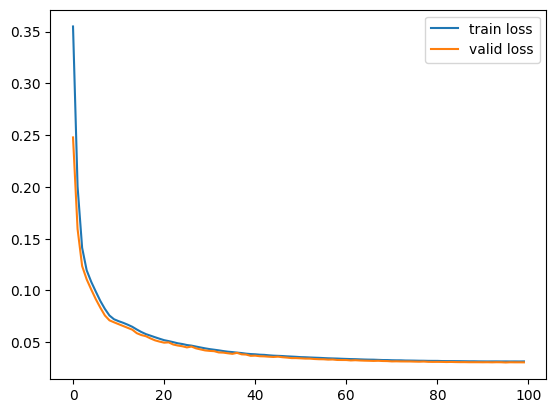

In [15]:
plt.plot(train_losses,label='train loss')
plt.plot(val_losses,label='valid loss')
plt.legend()
plt.show()

In [16]:
losses = pd.DataFrame({'train loss': train_losses, 'valid loss': val_losses})
losses.tail(15)

,train loss,valid loss
85,0.031712,0.030788
86,0.031653,0.030800
87,0.031589,0.030708
88,0.031605,0.030718
89,0.031519,0.030708
90,0.031494,0.030658
91,0.031461,0.030711
92,0.031491,0.030607
93,0.031508,0.030727
94,0.031458,0.030673


# Reconstructions

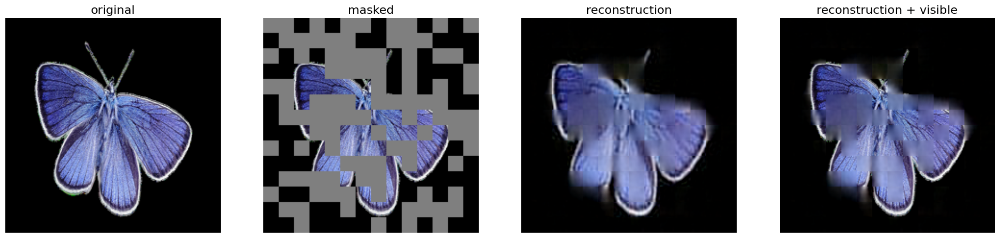

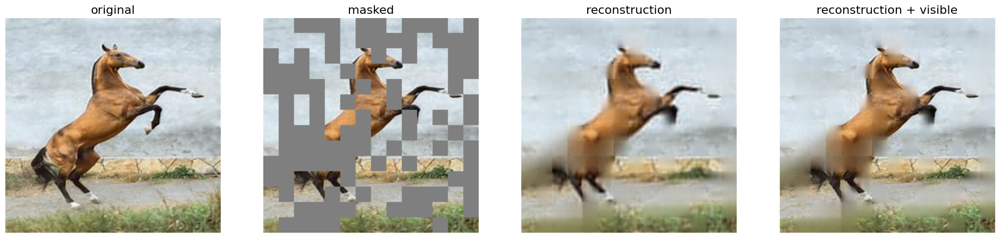

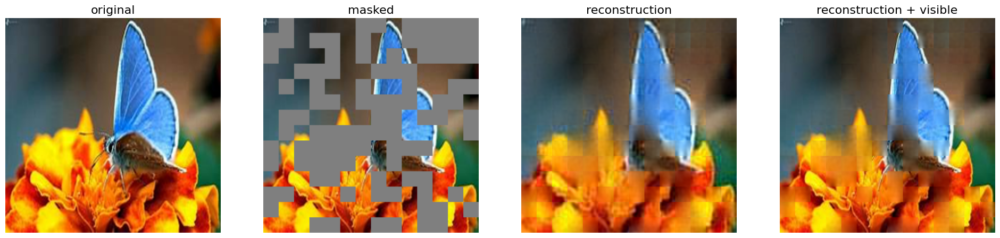

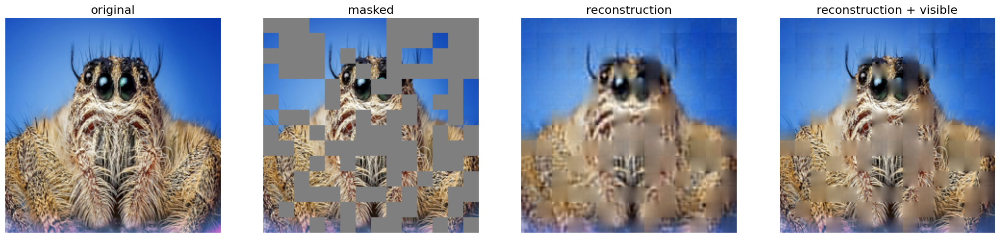

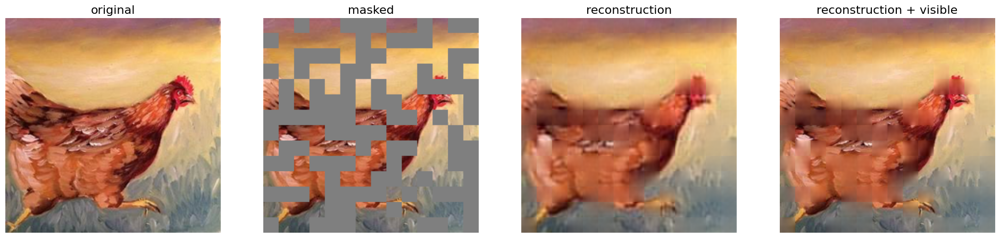

...

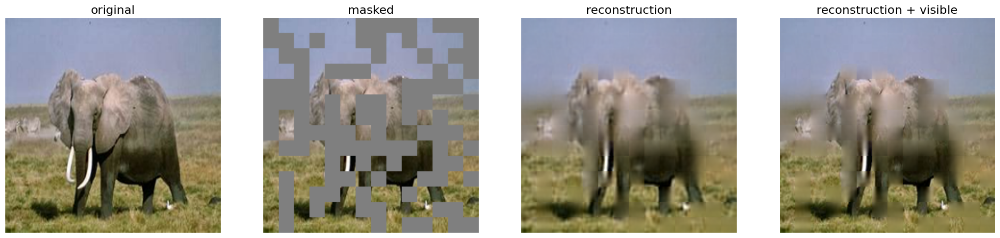

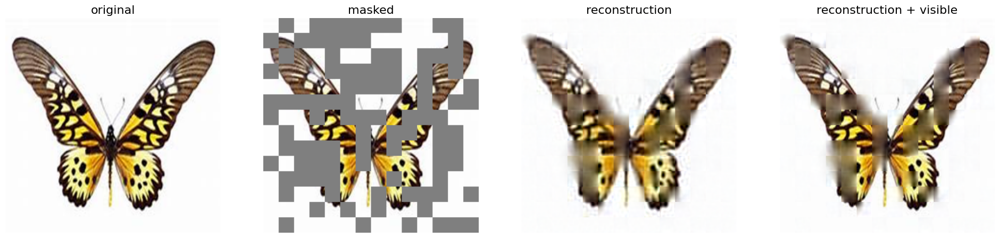

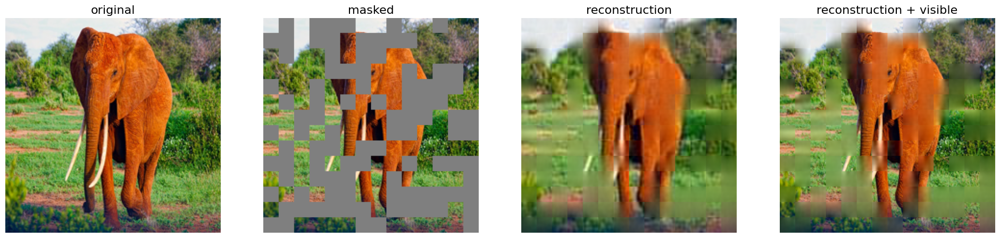

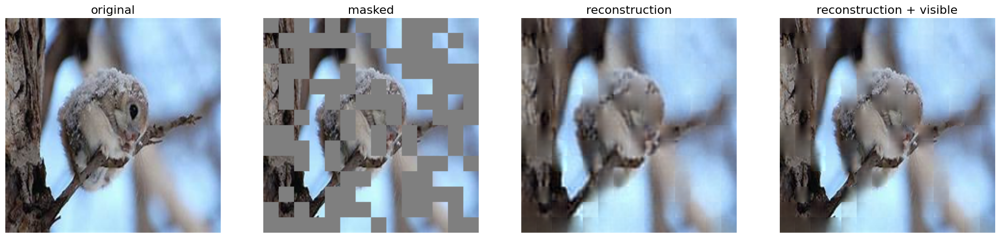

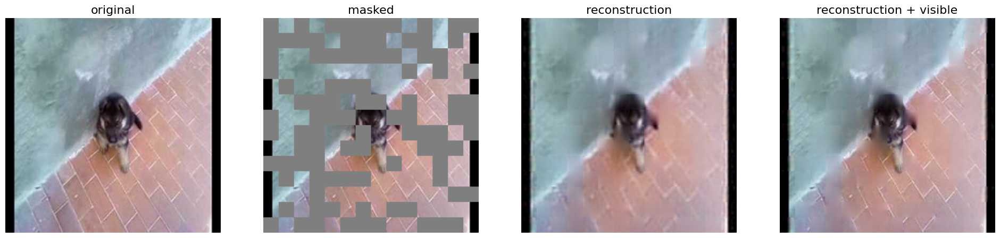

In [17]:
model.eval()
for _ in range(25):
    sample = val_ds[random.choice(range(len(val_ds)))]
    run_one_image(sample.unsqueeze(0))